
# **Exploring topics surrounding migration in Austrian historical newspapers**



*   in this notebook texts from Wienerisches Diarium (Wiener Zeitung from the 18th century) are used to train a BERTopic Dynamic Topic Model
*   timeframe of nrespapers: 1703 - 1798


Installations and imports


-  install BERTopic and import pandas and re for data handling


In [1]:
!pip install bertopic


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.7/224.7 kB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 8.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB

In [2]:
import pandas as pd
from bertopic import BERTopic
import re

The data is input through the previously prepared pickle file which contains the already tokenized texts (using data_prep_bert Jupyter Notebook)

In [3]:
# Path to the directory containing the text files
df_tokenized = 'input_files/df_tokenized.pk'

In [4]:
df_tokenized = pd.read_pickle(df_tokenized)


In [5]:
df_tokenized.shape

(79782, 2)

In [6]:
df_tokenized

,date,text
0,1703-08-13,Auss Wienn von biss Augusti 1703.
1,1703-08-13,DEn dito hat man dass die Land Militz welche ...
2,1703-08-13,Wie verlautet seynd Käyserl.
3,1703-08-13,in stehende Regimenter beordert ihren March ...
4,1703-08-13,Gestern ist ein Courier von der Armée auss Jta...
...,...,...
79777,1798-10-03,"Praktische französische Grammatik, wodurch man..."
79778,1798-10-03,"Von Johann Valentin Meidinger, Lehrer der fran..."
79779,1798-10-03,Fünfzehnte durchaus verbesserte und nach Waill...
79780,1798-10-03,Frankfurt und Leipzig 1799.


- The text is further processed by removal of some common stopwords.
- There is 297 unique dates from 1703 to 1798 and 79782 tokenized documents coming from  297 issues of Wienerisches Diarium
- Then, the texts in the column 'text' and the dates in the column 'date' are added to lists, as this is the input format for the DTM:

In [7]:
def clean_text(text):
    # Remove each word in the remove list
    for word in remove_list:
        text = re.sub(r'\b' + word + r'\b', '', text, flags=re.IGNORECASE)
    # Remove all numbers
    text = re.sub(numbers_re, '', text)
    return text

In [8]:
remove_list = ['das','sich', 'mit', 'ich', 'ist', 'mich', 'se', 'wir', 'nicht', 'nichts', 'keine', 'niemand','keinen',  'er', 'des', 'und', 'der', 'in', 'dem', 'von', 'den', 'zu', 'die','sei', 'corr', 'wurde', 'worden', 'sei', 'dr', 'fl', 'mehr', 'orig', 'pester lloyd', 'seid', 'sagen', 'sei', 'per', 'tl', 'telegramm', 'hur', 'kur', 'bur']
# Regular expression for matching all numbers
numbers_re = r'\b\d+\b'

In [9]:
df_tokenized['text'] = df_tokenized['text'].apply(clean_text)

In [10]:
num_unique_dates = len(df_tokenized['date'].unique())
num_unique_dates

297

In [11]:
timestamps  = df_tokenized.date.to_list()
texts = df_tokenized.text.to_list()

In [12]:
len(texts)

79782


- first, the necessary imports from BERTopic
- seed words are defined for the TFIDF model, which will increase the likelihood of the identification of topics of interest - topics surrounding migration, minorities and labour
- following seed words are used: "Fremd" (foreign), "Flüchtling" (refugee), "Arbeit" (work), "Einwanderer" (immigrant), “Zuwanderer” (immigrant), "Czechen" (Czech), “Polen” (Poles), “Kroaten” (Croatians), “Serben” (Serbians), “Bosnien” (Bosnia), “Slowak” (Slovak), “Slowen” (Slovenian), “Türken” (Turks), “Italien” (Italy), and “Deutschen” (Germans)
 -a multilingual BERTopic topic model is then trained, as the global representation needs to be generated before the DTM


 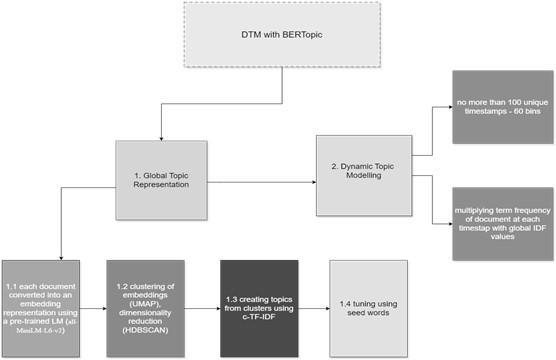



In [13]:
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, OpenAI, PartOfSpeech
from bertopic.vectorizers import ClassTfidfTransformer


In [14]:
ctfidf_model = ClassTfidfTransformer(
    seed_words=['Fremd', 'Flüchtling','Arbeiter', 'Einwanderer', 'einwandern', 'Zuwanderer', 'czechen', 'polen', 'kroaten', 'serben','bosnien','slowak', 'pol', 'magyar', 'slowen','türken', 'italien', 'juden', 'deutschen', 'arbeit'],
    seed_multiplier=10
)

- multilingual model, using the tfidf seed words, when the parameter 'verbose' is set to True it allows for tracking the stages of the model in the console
- all other parameters are default

In [15]:
topic_model_migra = BERTopic(verbose=True, language = "multilingual",ctfidf_model=ctfidf_model)

training and saving of the migration topic model

In [ ]:
topics, probs = topic_model_migra.fit_transform(texts)
topic_model_migra.save("models/digitarium_migra.mm")


Loading the topic model (in case you don't want to go through the training and just load the already trained mdoel)

In [17]:
topic_model_migra = BERTopic.load("models/digitarium_migra.mm")


- output the information on identified topics
- topic -1 are outliers

In [18]:
topic_info = topic_model_migra.get_topic_info()


In [19]:
topic_info.head(20)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,41304,-1_arbeit_deutschen_juden_und,"[arbeit, deutschen, juden, und, zu, der, in, d...",[Da nun zu Hin dangebung vorgedachter Behausun...
1,0,1476,0_schiffe_flotte_schiffen_hafen,"[schiffe, flotte, schiffen, hafen, admiral, sc...","[Wir vernehmen aus Kadix, dassderGrafGuichen30..."
2,1,901,1_königl_majestäten_majestät_könig,"[königl, majestäten, majestät, könig, majest, ...","[Der königl., Von der Königl., Die von der kön..."
3,2,552,2_türken_russischen_russische_polen,"[türken, russischen, russische, polen, russen,...","[Dar auf haben die Russen Anstalten gemacht, d..."
4,3,509,3_königl_kömgl__,"[königl, kömgl, , , , , , , , ]","[Königl., Königl., Königl.]"
5,4,427,4_cardinal_bischof_kirche_cardinälen,"[cardinal, bischof, kirche, cardinälen, concla...",[Und weilen in einer zuvor gehaltenen Congrega...
6,5,381,5_fürstl_titl_rescr_gläub,"[fürstl, titl, rescr, gläub, contra, vollhaupt...",[Detto seynd in der grossen Hof kapelle für di...
7,6,346,6_regimenter_regiment_armee_jnfanterie,"[regimenter, regiment, armee, jnfanterie, trup...",[Die Truppen so über Meer ausser Landes sollen...
8,7,326,7_gott_du_heil_euch,"[gott, du, heil, euch, deinen, ewigkeit, dir, ...",[der du alle Königreiche von Anbegin her regie...
9,8,318,8_deutschen_buchhandlung_büchern_bücher,"[deutschen, buchhandlung, büchern, bücher, lan...",[1782 7 30 | Jn der Edlen Ghelenschen Buch...


In [20]:
topic_info.to_csv('output_files/topic_info_digitarium.csv', encoding='utf-8')

- get a list of words per topic

In [21]:
topic_words = topic_model_migra.get_topics()
topics_list = [[word for word, _ in topic_words[topic]] for topic in topic_words if topic != -1]


In [22]:
topics_list

[['schiffe',
  'flotte',
  'schiffen',
  'hafen',
  'admiral',
  'schiff',
  'kriegs',
  'see',
  'schif',
  'meer'],
 ['königl',
  'majestäten',
  'majestät',
  'könig',
  'majest',
  'königs',
  'jhre',
  'prinzen',
  'prinz',
  'herzog'],
 ['türken',
  'russischen',
  'russische',
  'polen',
  'russen',
  'russland',
  'russisch',
  'petersburg',
  'rus',
  'russis'],
 ['königl', 'kömgl', '', '', '', '', '', '', '', ''],
 ['cardinal',
  'bischof',
  'kirche',
  'cardinälen',
  'conclave',
  'kirchen',
  'heiligkeit',
  'cardinäle',
  'päpstl',
  'ertz'],
 ['fürstl',
  'titl',
  'rescr',
  'gläub',
  'contra',
  'vollhauptischer',
  'grundbuch',
  'amtswegen',
  'schlei',
  'kreutz'],
 ['regimenter',
  'regiment',
  'armee',
  'jnfanterie',
  'truppen',
  'corps',
  'lager',
  'cavallerie',
  'regimentern',
  'bataillons'],
 ['gott',
  'du',
  'heil',
  'euch',
  'deinen',
  'ewigkeit',
  'dir',
  'lass',
  'göttlichen',
  'amen'],
 ['deutschen',
  'buchhandlung',
  'büchern',
  'büc

- getting the Document info - the info on identified topic per document
-this allows for extraction of all documents with a specific toic (e.g. Jews, education, Czechs, etc) and saving into csvs

In [23]:
document_info = topic_model_migra.get_document_info(texts)

In [24]:
document_info.to_csv('output_files/document_info_digitarium.csv', encoding='utf-8')

In [25]:
document_info.head()

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,Auss Wienn biss Augusti .,-1,-1_arbeit_deutschen_juden_und,"[arbeit, deutschen, juden, und, zu, der, in, d...",[Da nun zu Hin dangebung vorgedachter Behausun...,arbeit - deutschen - juden - und - zu - der - ...,0.000000,False
1,dito hat man dass Land Militz welche hin w...,-1,-1_arbeit_deutschen_juden_und,"[arbeit, deutschen, juden, und, zu, der, in, d...",[Da nun zu Hin dangebung vorgedachter Behausun...,arbeit - deutschen - juden - und - zu - der - ...,0.000000,False
2,Wie verlautet seynd Käyserl.,-1,-1_arbeit_deutschen_juden_und,"[arbeit, deutschen, juden, und, zu, der, in, d...",[Da nun zu Hin dangebung vorgedachter Behausun...,arbeit - deutschen - juden - und - zu - der - ...,0.000000,False
3,stehende Regimenter beordert ihren March sc...,6,6_regimenter_regiment_armee_jnfanterie,"[regimenter, regiment, armee, jnfanterie, trup...",[Die Truppen so über Meer ausser Landes sollen...,regimenter - regiment - armee - jnfanterie - t...,0.634586,False
4,Gestern ein Courier Armée auss Jtalien arr...,28,28_frantzosen_frantzösische_frantzösischen_fra...,"[frantzosen, frantzösische, frantzösischen, fr...",[Mit Brieffen auss Coblentz vom Augusti hat m...,frantzosen - frantzösische - frantzösischen - ...,0.639602,False


In [26]:
work = document_info.loc[document_info['Topic'] == 64]
jews = document_info.loc[document_info['Topic'] == 237]
french = document_info.loc[document_info['Topic'] == 15]
hungarn = document_info.loc[document_info['Topic'] == 236]


In [27]:
work.to_csv('output_files/work63_digi.csv', encoding='utf-8')
jews.to_csv('output_files/jews237_digi.csv', encoding='utf-8')
hungarn.to_csv('output_files/hungarn236_digi.csv', encoding='utf-8')

Exploring most similar topics to terms of interest

In [ ]:
similar_topics, similarity = topic_model_migra.find_topics("Migrant", top_n=5)
topic_model_migra.get_topic(similar_topics[0])


In [ ]:
similar_topics, similarity = topic_model_migra.find_topics("Migration", top_n=10)
topic_model_migra.get_topic(similar_topics[0])


In [ ]:
similar_topics, similarity = topic_model_migra.find_topics("fremde", top_n=5)
topic_model_migra.get_topic(similar_topics[0])


In [ ]:
similar_topics, similarity = topic_model_migra.find_topics("wandern", top_n=5)
topic_model_migra.get_topic(similar_topics[0])

In [ ]:
similar_topics, similarity = topic_model_migra.find_topics("Balkan", top_n=5)
topic_model_migra.get_topic(similar_topics[0])

In [ ]:
similar_topics, similarity = topic_model_migra.find_topics("Russland", top_n=10)
topic_model_migra.get_topic(similar_topics[0])

# **Dynamic Topic Modelling**



*   training the DTM model from the global topic representation (texts and timestamps are previously created lists
*   number of bins = 60, as there is over 100 timestamps, they need to be put into bins to ensure quality of model


In [35]:

topics_over_time = topic_model_migra.topics_over_time(texts, timestamps,
                                                global_tuning=True, evolution_tuning=True, nr_bins=60)


54it [01:39,  1.84s/it]


In [36]:
topic_model_migra.visualize_topics_over_time(topics_over_time, top_n_topics=10, topics=[15,2, 53, 64, 337, 237 ] )


In [37]:
topic_model_migra.visualize_topics()


In [42]:
topic_model_migra.visualize_topics_over_time(topics_over_time, topics=[0,1, 2, 3, 4, 5 ])


In [43]:
topic_model_migra.visualize_topics_over_time(topics_over_time, topics=[9, 10, 72, 83, 87, 91])


In [44]:
topic_model_migra.visualize_barchart()


Evauating BERTopic model with coherence metric

1.   issues with evaluation of modular, transformer-based library with coherence -https://github.com/MaartenGr/BERTopic/issues/2009, https://github.com/MaartenGr/BERTopic/issues/437
2.   human evaluation seems to be necessary - in the future a gold standard would be needed



In [45]:
import gensim
import nltk
from nltk.corpus import stopwords
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary

In [ ]:
# Ensure you have stopwords downloaded
nltk.download('stopwords')
stop_words = stopwords.words('german')  # Or 'english', 'french', etc.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in german_stopwords:
            result.append(token)
    return result



In [ ]:
german_stopwords = stopwords.words('german')


In [ ]:
processed_docs = [preprocess(text) for text in texts]


In [ ]:
dictionary = Dictionary(processed_docs)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs]


In [ ]:
coherence_model_bert = CoherenceModel(topics=topics_list, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_bert = coherence_model_bert.get_coherence()
print(f'BERTopic Coherence Score: {coherence_bert}')


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


BERTopic Coherence Score: 0.4204943251869702
